In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/fast_nas_adapt/fast_nas_adapt/


/content/drive/MyDrive/fast_nas_adapt/fast_nas_adapt


In [ ]:
1

1

In [ ]:
!git clone -b bahleg-experiments https://github.com/bahleg/fast_nas_adapt.git

Cloning into 'fast_nas_adapt'...
remote: Enumerating objects: 205, done.
remote: Counting objects: 100% (102/102), done.
remote: Compressing objects: 100% (70/70), done.
remote: Total 205 (delta 48), reused 72 (delta 31), pack-reused 103
Receiving objects: 100% (205/205), 43.26 MiB | 13.99 MiB/s, done.
Resolving deltas: 100% (93/93), done.


In [ ]:
#!rm -r fast_nas_adapt

In [ ]:
#!git checkout bahleg-experiments

In [ ]:
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 20.1 MB/s eta 0:00:00


In [ ]:
!rm *pckl

In [ ]:
import sys
sys.path.append('./src/')
import importlib
from matplotlib import pylab as plt

import numpy as np
import torch
import torchvision

import cifar_data
import utils #у меня есть utils библиотека, поэтому переименовала
import dartslike
import VGG19

import pickle
import os
import gc
import argparse
import dartslike

import importlib
import module2graph2
importlib.reload(module2graph2)
from torch.fx import symbolic_trace


In [ ]:
@torch.no_grad()
def safe_prune(model, trainloader, num_to_prune, gammas_to_prune):
    for x,y in trainloader:
        break
    num = 0
    for g in gammas_to_prune:
            model.gammas[g] = 1.0
    
    i = 0
    while num < num_to_prune and i < len(gammas_to_prune):
        model.gammas[i] = 0.0
  
        if abs(model(x) - model(torch.zeros(x.shape))).sum() < 1e-5:
            model.gammas[i] = 1.0
            i += 1
        else:
            num += 1
            i += 1
    if num == num_to_prune:
        return True
    else:
        return False 


In [ ]:

class LowRankLinear(torch.nn.Module):
    def __init__(self, in_, out_, dim=1):
        super().__init__()
        self.l = torch.nn.Parameter(torch.randn(in_, dim)*1e-3)
        self.r = torch.nn.Parameter(torch.randn(dim, out_) * 1e-3)
    
    def forward(self, x):
        #print (x.shape, self.l.shape, self.r.shape)
        return x@self.l@self.r


class Aux(torch.nn.Module):
    def __init__(self, sizes, layer_names):
        super().__init__()
        self.layers = torch.nn.ModuleList()
        self.layer_names = layer_names
        self.means_int = torch.nn.ModuleDict()
        self.lsigmas_int = torch.nn.ParameterDict()
        self.means_y = torch.nn.ModuleDict()
        self.lsigmas_y = torch.nn.ParameterDict()
        
        for i in range(len(layer_names)-1):
            current = layer_names[i]
            next_ = layer_names[i+1]
            mat_size = np.prod(sizes[current][1:]) * np.prod(sizes[next_][1:])
            if mat_size > 1024 * 1024:
                linear = LowRankLinear(np.prod(sizes[current][1:]), np.prod(sizes[next_][1:]))
            else:
                linear = torch.nn.Linear(np.prod(sizes[current][1:]), np.prod(sizes[next_][1:]))
            
            lsigma = torch.tensor(-2.0)
            self.means_int.update({current: linear})
            self.lsigmas_int.update({current: lsigma})
            self.layers.append(linear)
            
        for i in range(len(layer_names)):
            current = layer_names[i]
            linear = torch.nn.Linear(np.prod(sizes[current][1:]), 2)
            lsigma = torch.nn.Parameter(torch.tensor(-2.0))
            self.means_y.update({current: linear})
            self.lsigmas_y.update({current: lsigma})
            self.layers.append(linear)
            

In [ ]:
#!rm *pckl

In [ ]:

for seed in [0, 13, 42]:
    for parameter_opt_type in ['MI', 'CE']:
        for gamma_opt_type in ['MI', 'CE']:
            for lam in [0.0, 0.25, 0.5, 0.75, 1.0][::-1]:
                if gamma_opt_type == 'CE' and parameter_opt_type == 'CE' and lam != 0:
                    continue
                name = f'{parameter_opt_type}.{gamma_opt_type}.{lam}.{seed}'
                if os.path.exists(name+'.pckl'):
                  continue
                batch_size = 64
                device = 'cuda:0'
                trial_num = 1
                epoch_num = 50
                lr = 1e-3
                wd = 1e-6
                batch_seen = 5
                trainloader, valloader, testloader = cifar_data.get_dataloaders([0,1], batch_size=batch_size, need_val=True, cifar100 = True)
                model = VGG19.VGG19(num_classes = 10).to(device)
                model.load_state_dict(torch.load('../VGG19_CIFAR10.ckpt', map_location=device))
                model.model.classifier[6] = torch.nn.Linear(4096, 2)
                traced_graph = symbolic_trace(model)
                module2graph2.make_gamma_hooks(model, traced_graph, lambda: module2graph2.SigmoidGamma(0.0))
                model.to(device)
                sizes = {}
                model(torch.randn(64, 3, 33, 33).to(device))
                for k,v in model.intermediate.items():
                    sizes[k] = v.shape
                layer_names = [k for k in sizes]

                
                print (name)
                torch.manual_seed(seed)
                np.random.seed(seed)
                def intermediate_getter(x):
                    out = model(x)[0]
                    inter = model.intermediate
                    return out, inter 
                aux = Aux(sizes, layer_names).to(device)

                dl = dartslike.DartsLikeTrainer(model, parameter_optimization=parameter_opt_type, gamma_optimization=gamma_opt_type,
                                                    aux=aux,MI_Y_lambda=lam, layer_wise=False)
            
                history = dl.train_loop(trainloader, valloader, testloader, batch_seen, epoch_num, lr, lr, device, wd, model,
                                        intermediate_getter = intermediate_getter)

                with open(name+'.pckl','wb') as out:
                    #out.write(pickle.dumps( (history, model.cpu().state_dict())))
                    out.write(pickle.dumps( (history)))



Using downloaded and verified file: ./data/cifar-100-python.tar.gz
Extracting ./data/cifar-100-python.tar.gz to ./data
Files already downloaded and verified
MI.MI.1.0.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5550000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5249999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5099999904632568


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.6100000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.7350000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.5299999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.5049999952316284


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.8849999904632568


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.8799999952316284


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.8399999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.8550000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.949999988079071
Files already downloaded and verified
Files already downloaded and verified
MI.MI.0.75.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.8999999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9049999713897705


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.8849999904632568


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.8899999856948853


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.8500000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9700000286102295
Files already downloaded and verified
Files already downloaded and verified
MI.MI.0.5.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.7350000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.8949999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.8899999856948853


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.8949999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.8899999856948853


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.875


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9599999785423279
Files already downloaded and verified
Files already downloaded and verified
MI.MI.0.25.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.800000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.8199999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.8899999856948853


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.8450000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.8650000095367432


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.8700000047683716


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.8450000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.8999999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.925000011920929
Files already downloaded and verified
Files already downloaded and verified
MI.MI.0.0.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.5
Files already downloaded and verified
Files already downloaded and verified
MI.CE.1.0.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9850000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9800000190734863
Files already downloaded and verified
Files already downloaded and verified
MI.CE.0.75.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.7200000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.8700000047683716


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9049999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.8799999952316284


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9049999713897705


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.8849999904632568


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9549999833106995
Files already downloaded and verified
Files already downloaded and verified
MI.CE.0.5.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.7599999904632568


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.9100000262260437


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.875


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9750000238418579
Files already downloaded and verified
Files already downloaded and verified
MI.CE.0.25.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.8849999904632568


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.8399999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.8949999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9049999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.8949999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.875


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9049999713897705


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9850000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9599999785423279
Files already downloaded and verified
Files already downloaded and verified
MI.CE.0.0.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.5
Files already downloaded and verified
Files already downloaded and verified
CE.MI.1.0.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9049999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9599999785423279
Files already downloaded and verified
Files already downloaded and verified
CE.MI.0.75.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.8899999856948853


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.8949999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.8650000095367432
Files already downloaded and verified
Files already downloaded and verified
CE.MI.0.5.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5299999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9700000286102295
Files already downloaded and verified
Files already downloaded and verified
CE.MI.0.25.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.6899999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9850000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9850000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9850000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9850000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9850000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9850000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9850000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9850000143051147
Files already downloaded and verified
Files already downloaded and verified
CE.MI.0.0.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.875


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9700000286102295
Files already downloaded and verified
Files already downloaded and verified
CE.CE.0.0.0


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.9100000262260437


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9049999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9850000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9900000095367432


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9850000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9649999737739563
Files already downloaded and verified
Files already downloaded and verified
MI.MI.1.0.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.8299999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.5450000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.8949999809265137


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.675000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.8450000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.5049999952316284


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.8849999904632568


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.8799999952316284


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9100000262260437


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.8899999856948853


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.8299999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.7599999904632568


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.8700000047683716


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.8050000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.875


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.6549999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.6600000262260437


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.8100000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.7450000047683716


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.8949999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.8299999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9150000214576721
Files already downloaded and verified
Files already downloaded and verified
MI.MI.0.75.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5799999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.8600000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.8899999856948853
Files already downloaded and verified
Files already downloaded and verified
MI.MI.0.5.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.5249999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.8899999856948853


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9100000262260437


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.8999999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.8899999856948853


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9350000023841858
Files already downloaded and verified
Files already downloaded and verified
MI.MI.0.25.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.875


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.8700000047683716


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.8600000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.8299999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.8299999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9049999713897705


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.8450000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.8650000095367432


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.8600000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.824999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.7549999952316284


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.8700000047683716


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.8700000047683716


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.8500000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.8700000047683716


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.8949999809265137


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.8899999856948853


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.8899999856948853


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.8899999856948853


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9100000262260437


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.8600000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.8600000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.875


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.875


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.8500000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.8450000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.8500000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9300000071525574
Files already downloaded and verified
Files already downloaded and verified
MI.MI.0.0.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.5
Files already downloaded and verified
Files already downloaded and verified
MI.CE.1.0.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.7599999904632568


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9549999833106995
Files already downloaded and verified
Files already downloaded and verified
MI.CE.0.75.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.6150000095367432


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.8949999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9049999713897705


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.8949999809265137


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.8650000095367432


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9049999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9599999785423279
Files already downloaded and verified
Files already downloaded and verified
MI.CE.0.5.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.8500000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.6299999952316284


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.8399999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.8899999856948853


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.8550000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.8700000047683716


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.875


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.8949999809265137


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.8949999809265137


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9049999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9549999833106995
Files already downloaded and verified
Files already downloaded and verified
MI.CE.0.25.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.7900000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.875


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.8999999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.8849999904632568


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.7900000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.8899999856948853


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9100000262260437


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.8999999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9049999713897705


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9049999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.8849999904632568


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.8849999904632568


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9449999928474426
Files already downloaded and verified
Files already downloaded and verified
MI.CE.0.0.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.5
Files already downloaded and verified
Files already downloaded and verified
CE.MI.1.0.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.875


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.8899999856948853


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.8650000095367432


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.949999988079071
Files already downloaded and verified
Files already downloaded and verified
CE.MI.0.75.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.8849999904632568


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9850000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9750000238418579
Files already downloaded and verified
Files already downloaded and verified
CE.MI.0.5.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9750000238418579


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9549999833106995
Files already downloaded and verified
Files already downloaded and verified
CE.MI.0.25.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.875


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.875


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9649999737739563
Files already downloaded and verified
Files already downloaded and verified
CE.MI.0.0.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5049999952316284


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.75


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9800000190734863


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.8600000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.8949999809265137


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9049999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9850000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9649999737739563
Files already downloaded and verified
Files already downloaded and verified
CE.CE.0.0.13


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5299999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.8849999904632568


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.8849999904632568


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.8600000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.949999988079071
Files already downloaded and verified
Files already downloaded and verified
MI.MI.1.0.42


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.8899999856948853


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.6800000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.5450000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.5299999713897705


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.7350000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.8600000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.8299999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9049999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.8899999856948853


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.8949999809265137


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.8999999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.8949999809265137
Files already downloaded and verified
Files already downloaded and verified
MI.MI.0.75.42


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.8450000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.8949999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.8399999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.8999999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9049999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9100000262260437


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.8999999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.949999988079071
Files already downloaded and verified
Files already downloaded and verified
MI.MI.0.5.42


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.8899999856948853


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.7350000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.8700000047683716


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.8949999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.8899999856948853


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9049999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.949999988079071
Files already downloaded and verified
Files already downloaded and verified
MI.MI.0.25.42


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.8899999856948853


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.8849999904632568


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.8999999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.8199999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9049999713897705


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.8399999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.7599999904632568


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9100000262260437


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9449999928474426
Files already downloaded and verified
Files already downloaded and verified
MI.MI.0.0.42


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.5
Files already downloaded and verified
Files already downloaded and verified
MI.CE.1.0.42


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.6150000095367432


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9700000286102295
Files already downloaded and verified
Files already downloaded and verified
MI.CE.0.75.42


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.8799999952316284


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.8600000143051147


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9100000262260437


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.8999999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.8949999809265137


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9049999713897705


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9100000262260437


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.8500000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9049999713897705


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9350000023841858
Files already downloaded and verified
Files already downloaded and verified
MI.CE.0.5.42


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9300000071525574


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9150000214576721


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.8899999856948853


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.8849999904632568


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.8600000143051147


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9100000262260437


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9750000238418579


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9649999737739563
Files already downloaded and verified
Files already downloaded and verified
MI.CE.0.25.42


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.8999999761581421


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.8399999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.8149999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9200000166893005


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.8949999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.925000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.8849999904632568


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.8949999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9599999785423279
Files already downloaded and verified
Files already downloaded and verified
MI.CE.0.0.42


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.5
Files already downloaded and verified
Files already downloaded and verified
CE.MI.1.0.42


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.800000011920929


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.8799999952316284


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.875


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9350000023841858


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9350000023841858


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9100000262260437


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 250. Accuracy: 0.9200000166893005


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31. Batch seen: 255. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32. Batch seen: 260. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 265. Accuracy: 0.9700000286102295


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33. Batch seen: 270. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 275. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34. Batch seen: 280. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35. Batch seen: 285. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 290. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36. Batch seen: 295. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37. Batch seen: 300. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 305. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38. Batch seen: 310. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 315. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39. Batch seen: 320. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40. Batch seen: 325. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 330. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41. Batch seen: 335. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42. Batch seen: 340. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 345. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43. Batch seen: 350. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 355. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44. Batch seen: 360. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45. Batch seen: 365. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 370. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46. Batch seen: 375. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47. Batch seen: 380. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 385. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48. Batch seen: 390. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 395. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49. Batch seen: 400. Accuracy: 0.9549999833106995
Files already downloaded and verified
Files already downloaded and verified
CE.MI.0.75.42


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.875


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.9150000214576721


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.925000011920929


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.9399999976158142


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10. Batch seen: 85. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 90. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11. Batch seen: 95. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12. Batch seen: 100. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 105. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13. Batch seen: 110. Accuracy: 0.9549999833106995


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 115. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14. Batch seen: 120. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15. Batch seen: 125. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 130. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16. Batch seen: 135. Accuracy: 0.9800000190734863


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17. Batch seen: 140. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 145. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18. Batch seen: 150. Accuracy: 0.9449999928474426


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 155. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19. Batch seen: 160. Accuracy: 0.9399999976158142


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20. Batch seen: 165. Accuracy: 0.9300000071525574


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 170. Accuracy: 0.9449999928474426


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21. Batch seen: 175. Accuracy: 0.949999988079071


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22. Batch seen: 180. Accuracy: 0.9700000286102295


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 185. Accuracy: 0.9599999785423279


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23. Batch seen: 190. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 195. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24. Batch seen: 200. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25. Batch seen: 205. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 210. Accuracy: 0.9649999737739563


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26. Batch seen: 215. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27. Batch seen: 220. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 225. Accuracy: 0.949999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28. Batch seen: 230. Accuracy: 0.9599999785423279


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 235. Accuracy: 0.9549999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29. Batch seen: 240. Accuracy: 0.9649999737739563


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30. Batch seen: 245. Accuracy: 0.9649999737739563


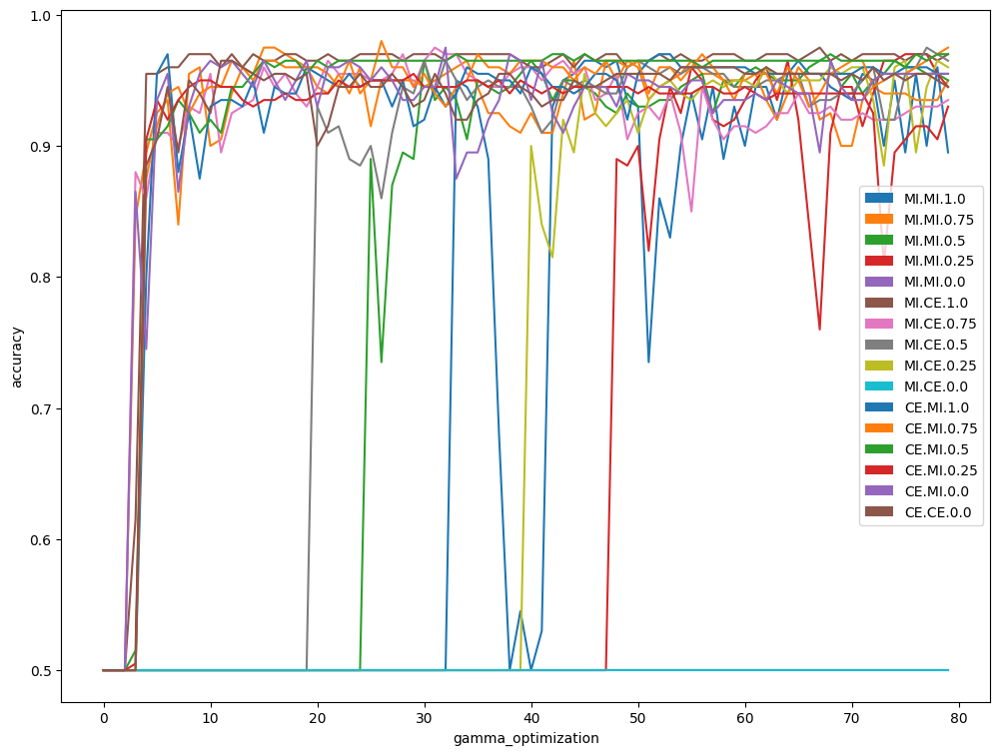

In [ ]:
import pickle
import matplotlib.pylab as plt
import numpy as np 
%matplotlib inline

plt.rcParams['figure.figsize'] = (12, 9)
plt.xlabel('gamma_optimization')
plt.ylabel('accuracy')

for parameter_opt_type in ['MI', 'CE']:
    for gamma_opt_type in ['MI', 'CE']:
        for lam in [0.0, 0.25, 0.5, 0.75, 1.0][::-1]:
          results = []
          name = f'{parameter_opt_type}.{gamma_opt_type}.{lam}.{seed}'
          if gamma_opt_type == 'CE' and parameter_opt_type == 'CE' and lam != 0:
                continue

          for seed in [0, 13, 42]:
            
            
            with open(name+'.pckl', 'rb') as inp:
              results.append(pickle.loads(inp.read()))
          plt.plot(np.mean(results, 0))
          plt.fill_between(list(range(len(results[0]))), np.mean(results, 0) - np.std(results, 0), np.mean(results, 0) + np.std(results, 0), label= f'{parameter_opt_type}.{gamma_opt_type}.{lam}', alpha=0.5)
plt.legend(loc='best')
            


In [ ]:
np.std(results, 0)

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [ ]:
results

[]

MI.MI.0.5.1


In [ ]:
result = model(torch.randn(64, 3, 33, 33).to(device))

In [ ]:
!git pull

remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 4 (delta 3), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (4/4), 719 bytes | 1024 bytes/s, done.
From https://github.com/bahleg/fast_nas_adapt
   ce9b749..41b4bcb  bahleg-experiments -> origin/bahleg-experiments
Updating ce9b749..41b4bcb
Fast-forward
 src/dartslike.py | 2 +-
 1 file changed, 1 insertion(+), 1 deletion(-)


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 1. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 2. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 3. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 4. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 5. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 6. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 7. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0. Batch seen: 8. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 9. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 10. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 11. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 12. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 13. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 14. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 15. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1. Batch seen: 16. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 17. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 18. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 19. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 20. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 21. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 22. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 23. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2. Batch seen: 24. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 25. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 26. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 27. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 28. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 29. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 30. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 31. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3. Batch seen: 32. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 33. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 34. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 35. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 36. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 37. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 38. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 39. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4. Batch seen: 40. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 41. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 42. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 43. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 44. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 45. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 46. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 47. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5. Batch seen: 48. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 49. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 50. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 51. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 52. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 53. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 54. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 55. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6. Batch seen: 56. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 57. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 58. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 59. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 60. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 61. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 62. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 63. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7. Batch seen: 64. Accuracy: 0.5


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 65. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 66. Accuracy: 0.5


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 67. Accuracy: 0.875


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 68. Accuracy: 0.8899999856948853


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 69. Accuracy: 0.8949999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 70. Accuracy: 0.8999999761581421


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 71. Accuracy: 0.9049999713897705


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8. Batch seen: 72. Accuracy: 0.8949999809265137


0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 73. Accuracy: 0.8849999904632568


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 74. Accuracy: 0.8849999904632568


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 75. Accuracy: 0.875


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 76. Accuracy: 0.7699999809265137


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 77. Accuracy: 0.7049999833106995


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 78. Accuracy: 0.7400000095367432


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 79. Accuracy: 0.824999988079071


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9. Batch seen: 80. Accuracy: 0.8650000095367432


In [ ]:
for g in model.named_modules():
  if 'gamma' in g[0].lower():
    print (g[0], list(g[1].parameters()))

model.features.0.gamma_model_features_0 [Parameter containing:
tensor(0.0313, requires_grad=True)]
model.features.1.gamma_model_features_1 [Parameter containing:
tensor(-0.0025, requires_grad=True)]
model.features.2.gamma_model_features_2 [Parameter containing:
tensor(-0.0025, requires_grad=True)]
model.features.3.gamma_model_features_3 [Parameter containing:
tensor(-0.0025, requires_grad=True)]
model.features.4.gamma_model_features_4 [Parameter containing:
tensor(-0.0049, requires_grad=True)]
model.features.5.gamma_model_features_5 [Parameter containing:
tensor(-0.0049, requires_grad=True)]
model.features.6.gamma_model_features_6 [Parameter containing:
tensor(-0.0049, requires_grad=True)]
model.features.7.gamma_model_features_7 [Parameter containing:
tensor(-0.0049, requires_grad=True)]
model.features.8.gamma_model_features_8 [Parameter containing:
tensor(-0.0011, requires_grad=True)]
model.features.9.gamma_model_features_9 [Parameter containing:
tensor(-0.0012, requires_grad=True)]
m

In [ ]:
len(model.gammas)

424

In [ ]:
for g in model.gammas:
  print (g)

Parameter containing:
tensor(-0.0033, requires_grad=True)
Parameter containing:
tensor(-0.0025, requires_grad=True)
Parameter containing:
tensor(0.0088, requires_grad=True)
Parameter containing:
tensor(-0.0168, requires_grad=True)
Parameter containing:
tensor(0.0050, requires_grad=True)
Parameter containing:
tensor(-0.0012, requires_grad=True)
Parameter containing:
tensor(-0.0168, requires_grad=True)
Parameter containing:
tensor(-0.0025, requires_grad=True)
Parameter containing:
tensor(0.0050, requires_grad=True)
Parameter containing:
tensor(0.0419, requires_grad=True)
Parameter containing:
tensor(-0.0105, requires_grad=True)
Parameter containing:
tensor(-0.0155, requires_grad=True)
Parameter containing:
tensor(-0.0036, requires_grad=True)
Parameter containing:
tensor(-0.0006, requires_grad=True)
Parameter containing:
tensor(-0.0091, requires_grad=True)
Parameter containing:
tensor(-0.0154, requires_grad=True)
Parameter containing:
tensor(0.0313, requires_grad=True)
Parameter containin